# Runs the enrichment methods on the simulation data with additional  AUROC calculations and also with negative gene set filtering for all methods.
                                                                
### INPUT: 

 * data/sim_data/splat_MyDE.h5ad
 
### OUTPUT: 

 * None, plots within   
 
## Environment Setup

In [4]:
work_dir = './' #Set to Cytocipher_mansucript/ git clone location.
import os, sys
os.chdir(work_dir)

import numpy as np
import pandas as pd
import scanpy as sc
import matplotlib
import matplotlib.pyplot as plt

from sklearn.metrics import pairwise_distances

import utils.visualisation.helpers as vhs
import utils.visualisation.quick_plots as qpl
qpl.setUp()

import seaborn as sb

import importlib as imp

import cytocipher.score_and_merge.cluster_score as cs
imp.reload(cs)

data_dir = 'data/sim_data/'

## Load the data

In [3]:
data = sc.read_h5ad(data_dir+'splat_MyDE.h5ad')

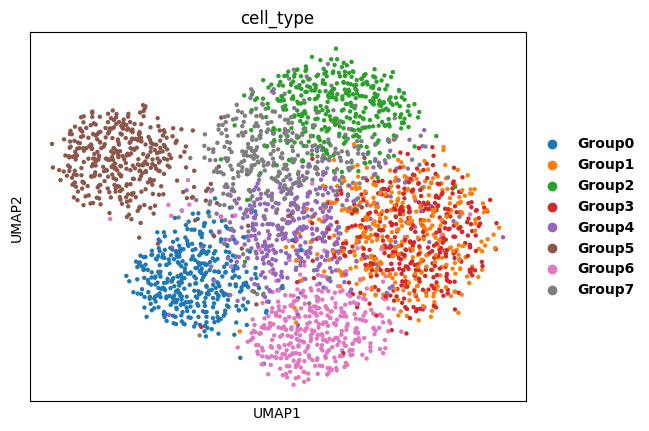

In [4]:
sc.pl.umap(data, color='cell_type')

## Setting up info about the DE gene groups

In [5]:
group_to_de = {}
all_de_genes = []
for groupi in range(len(data.uns['de_info_sim'])):
    group = f'Group{groupi}'
    fcs = data.uns['de_info_sim'][group]['fcs']
    order = np.argsort(-fcs)
    de_genes = data.uns['de_info_sim'][group]['de_genes']
    group_to_de[group] = de_genes #[order[0:3]] # Just top 3 genes
    all_de_genes.extend(de_genes)

group_to_de

{'Group0': array(['Gene702', 'Gene824', 'Gene1880', 'Gene5671', 'Gene6481',
        'Gene7434'], dtype=object),
 'Group1': array(['Gene3094', 'Gene3792', 'Gene5671'], dtype=object),
 'Group2': array(['Gene3094', 'Gene3776', 'Gene5066', 'Gene5671', 'Gene6481',
        'Gene7274'], dtype=object),
 'Group3': array(['Gene3094', 'Gene3792', 'Gene5671', 'Gene6871'], dtype=object),
 'Group4': array(['Gene702', 'Gene3094', 'Gene5671', 'Gene7434'], dtype=object),
 'Group5': array(['Gene393', 'Gene702', 'Gene824', 'Gene3776', 'Gene7274',
        'Gene7434'], dtype=object),
 'Group6': array(['Gene393', 'Gene1880', 'Gene3792', 'Gene5671', 'Gene7434',
        'Gene7970'], dtype=object),
 'Group7': array(['Gene393', 'Gene702', 'Gene3094', 'Gene5671', 'Gene6481',
        'Gene7274'], dtype=object)}

In [6]:
data.uns['cell_type_markers'] = group_to_de

## Running neurotools code enrichment method

In [7]:
imp.reload(cs)

<module 'cytocipher.cluster.cluster_score' from '/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/cluster/cluster_score.py'>

In [ ]:
cs.code_enrich(data, 'cell_type', cluster_marker_key='cell_type_markers')
data.obsm['code_enrich_scores'] = data.obsm['cell_type_enrich_scores']

In [9]:
data.obsm['cell_type_enrich_scores']

,Group0,Group1,Group2,Group3,Group4,Group5,Group6,Group7
Cell1,0.000000,4.172257,0.000000,8.431449,0.0,0.000000,0.0,0.00000
Cell2,11.212715,0.000000,0.000000,0.000000,0.0,0.000000,0.0,17.24542
Cell3,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.00000
Cell4,0.000000,0.000000,0.000000,0.000000,0.0,14.448889,0.0,0.00000
Cell5,0.000000,6.404527,0.000000,6.404527,0.0,0.000000,0.0,0.00000
...,...,...,...,...,...,...,...,...
Cell2996,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.0,0.00000
Cell2997,0.000000,5.171403,14.831064,0.000000,0.0,0.000000,0.0,0.00000
Cell2998,0.000000,5.212426,0.000000,0.000000,0.0,0.000000,0.0,0.00000
Cell2999,0.000000,14.150471,0.000000,19.050166,0.0,0.000000,0.0,0.00000


/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


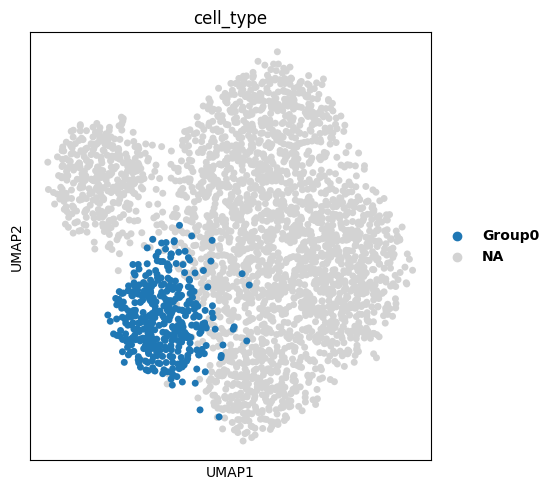

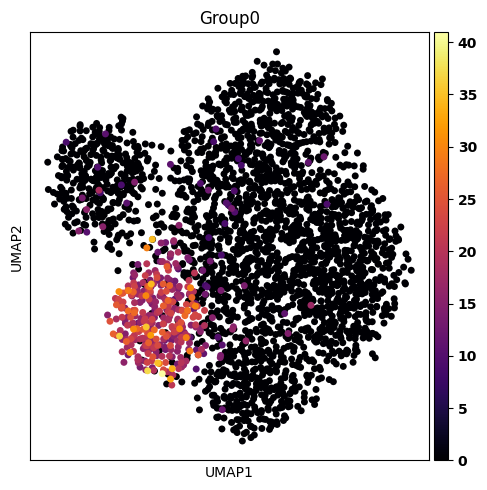

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


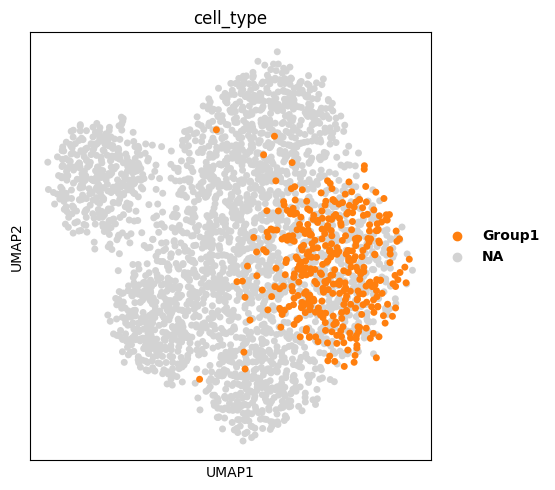

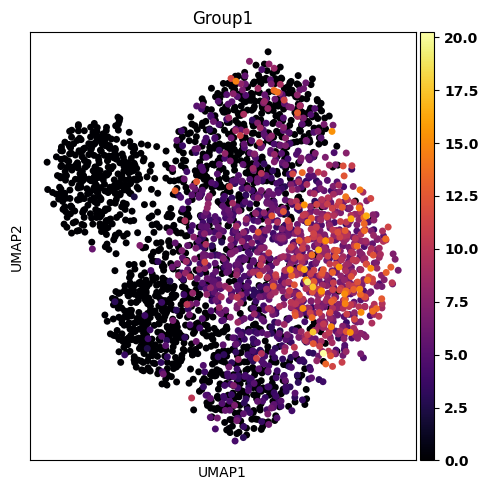

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


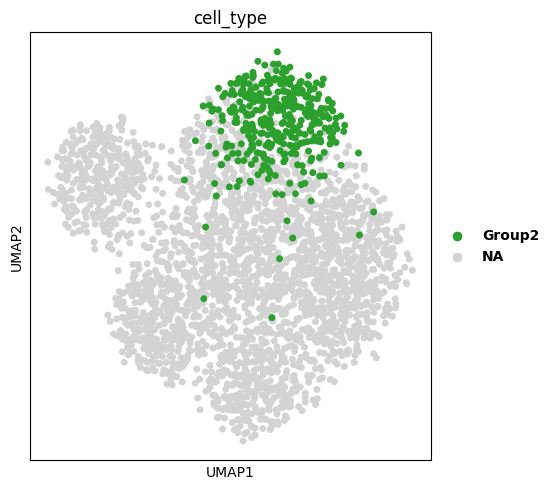

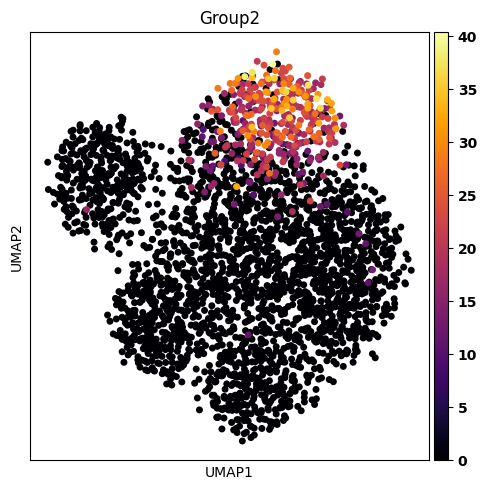

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


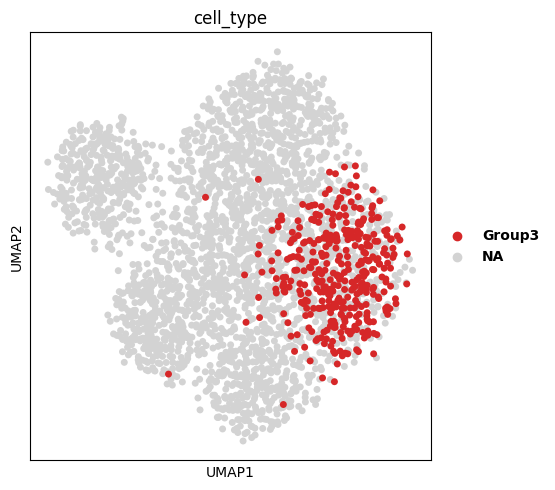

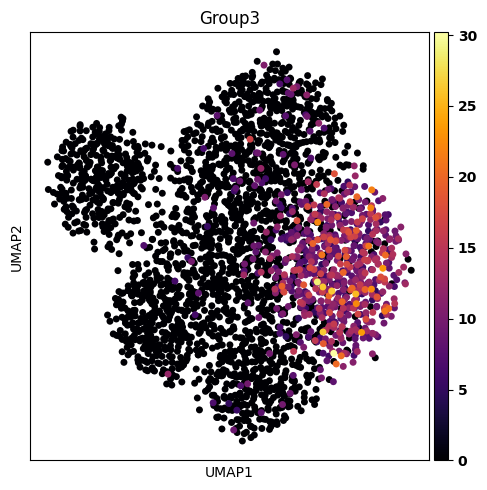

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


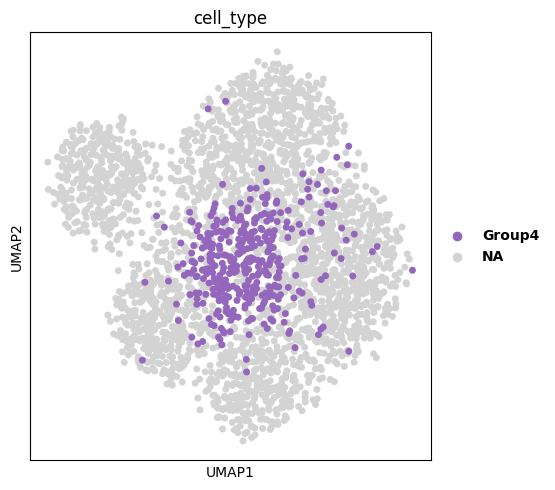

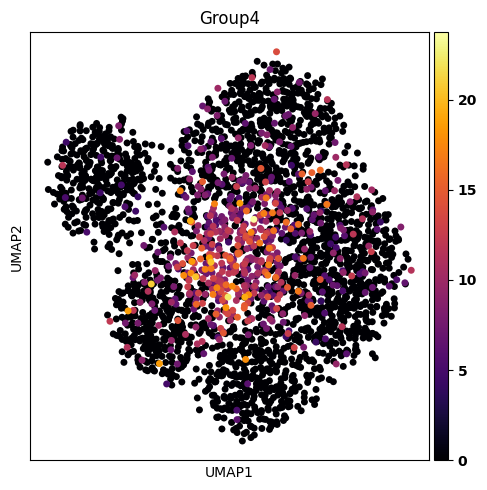

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


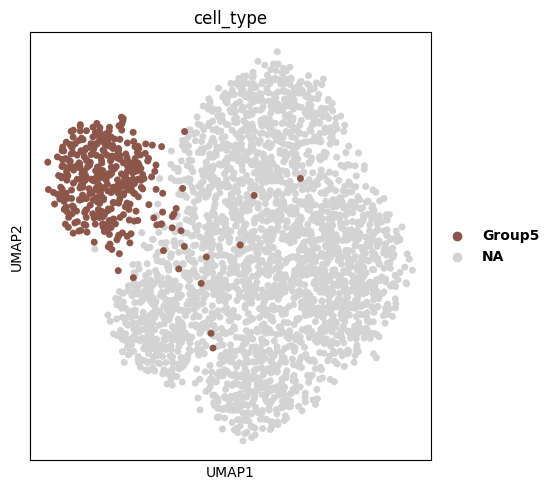

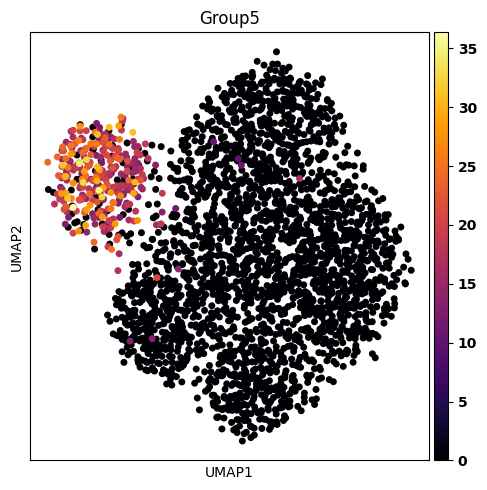

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


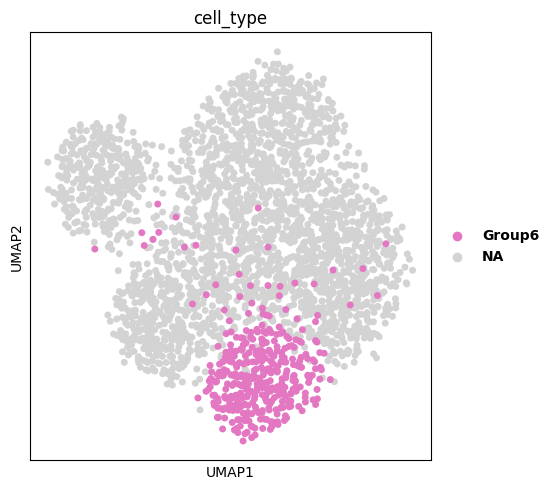

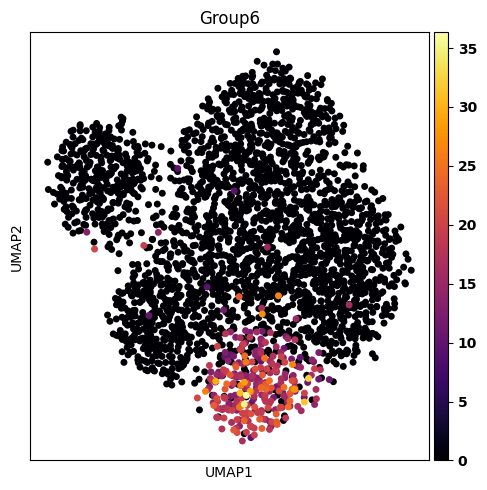

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


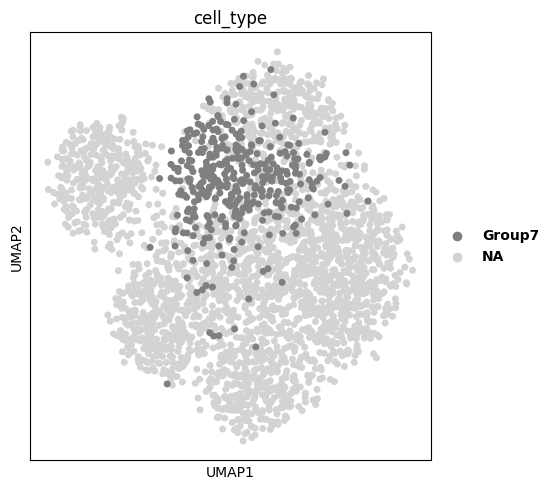

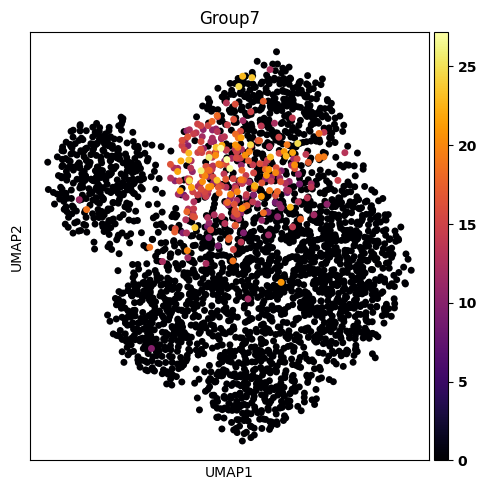

In [12]:
cmap = 'inferno'
s = 100
for coli in range(scores.shape[1]):

    fig, ax = plt.subplots(figsize=(5.65, 5))
    sc.pl.umap(data, color='cell_type', ax=ax, groups=[f'Group{coli}'], show=False, size=s)
    vhs.dealWithPlot(True, True, True, out_plots, f'sim_celltype_Group{coli}_umap.pdf', 300)
    
    fig, ax = plt.subplots(figsize=(5, 5))
    sc.pl.umap(data, color=f'Group{coli}', ax=ax, show=False, cmap=cmap, size=s)
    vhs.dealWithPlot(True, True, True, out_plots, f'sim_code-enrich_Group{coli}_umap.pdf', 300)

## Now let's try not considering the combinatorics..

In [ ]:
cs.coexpr_enrich(data, 'cell_type', cluster_marker_key='cell_type_markers')
data.obsm['coexpr_enrich_scores'] = data.obsm['cell_type_enrich_scores']

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


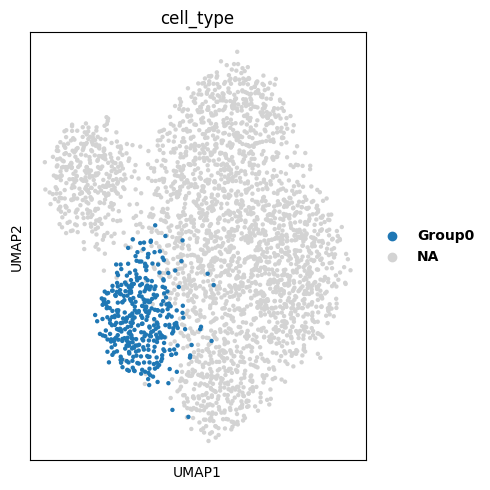

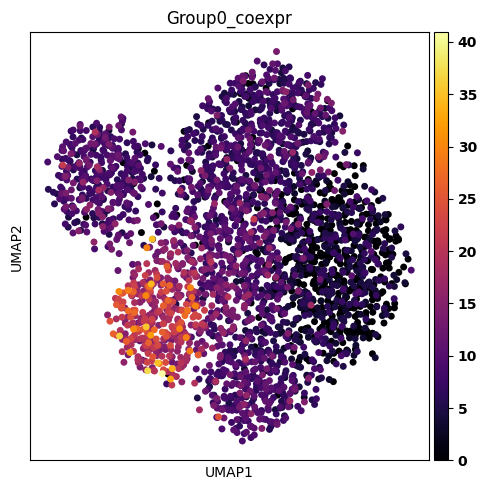

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


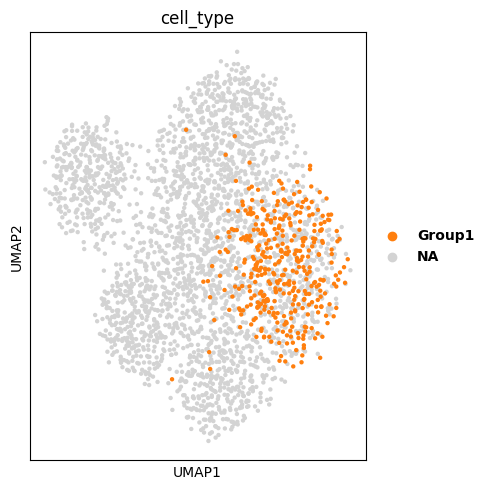

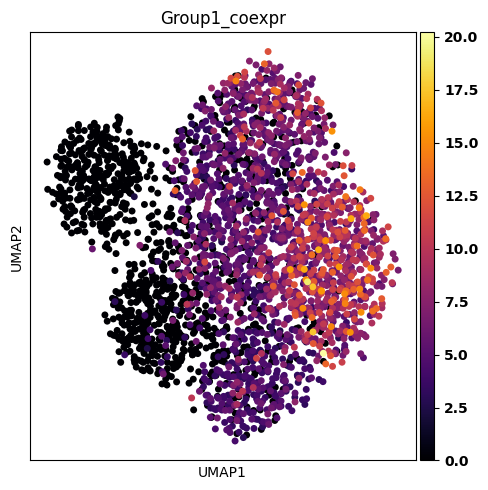

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


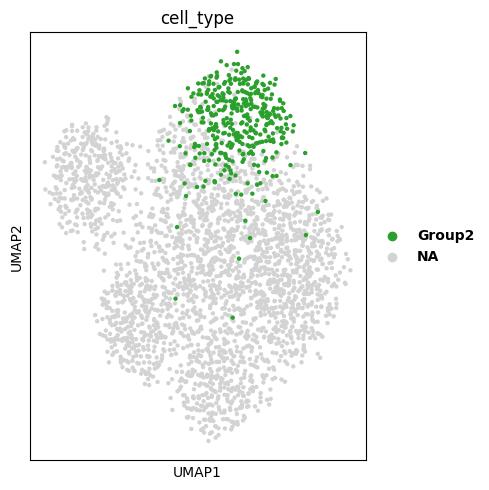

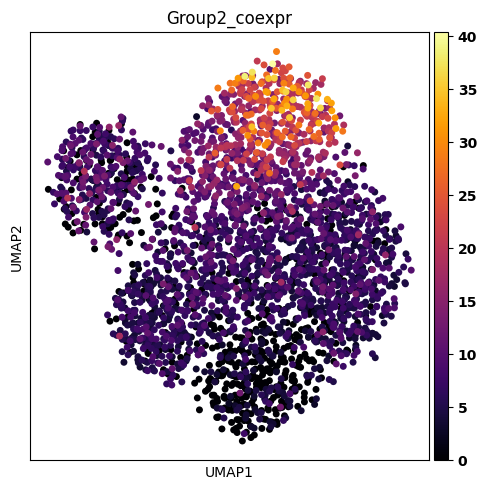

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


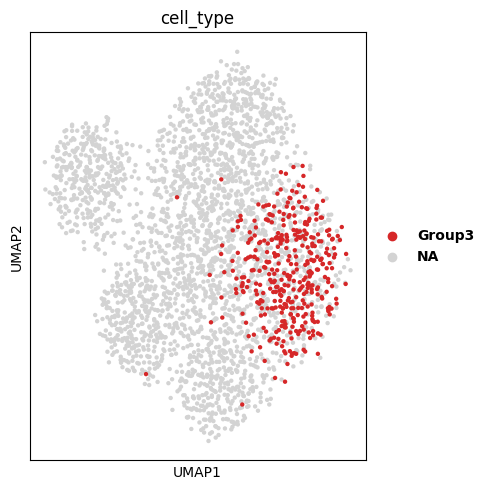

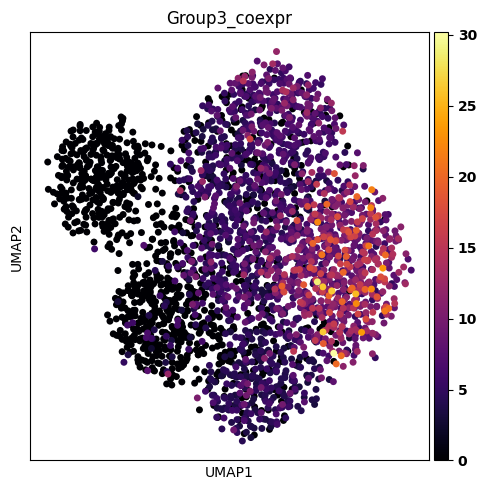

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


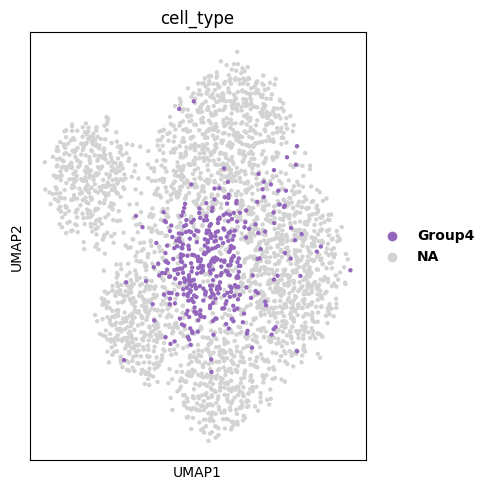

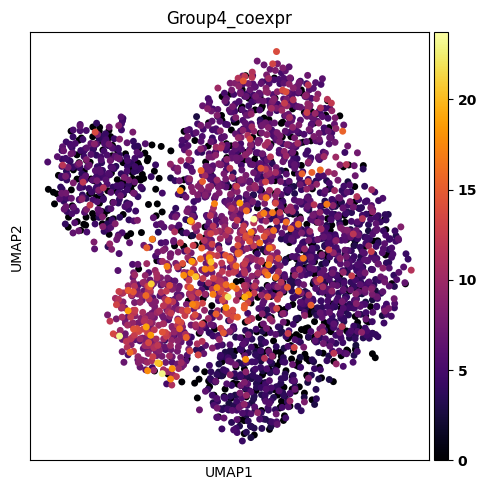

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


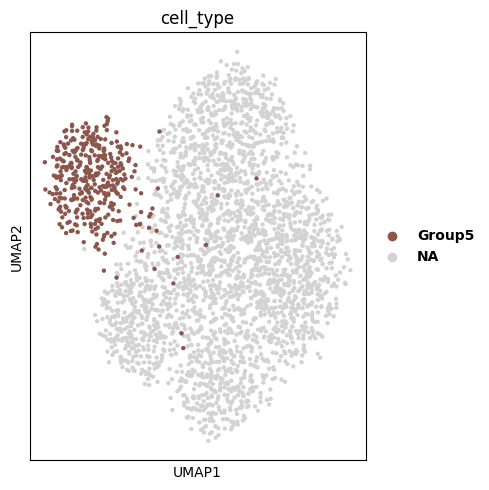

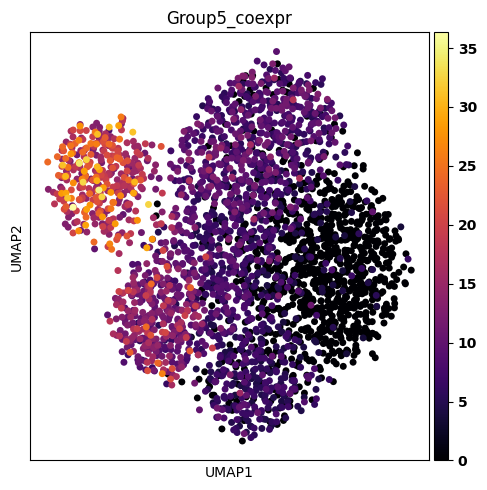

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


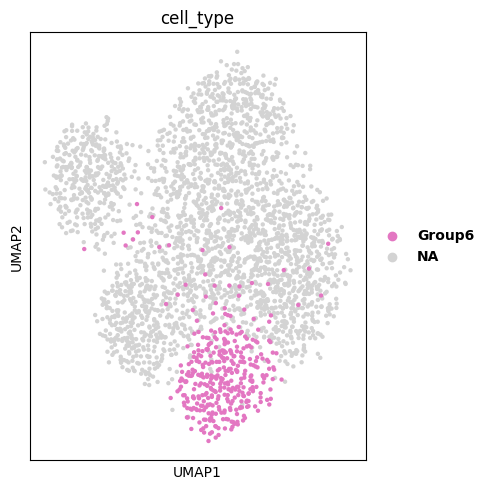

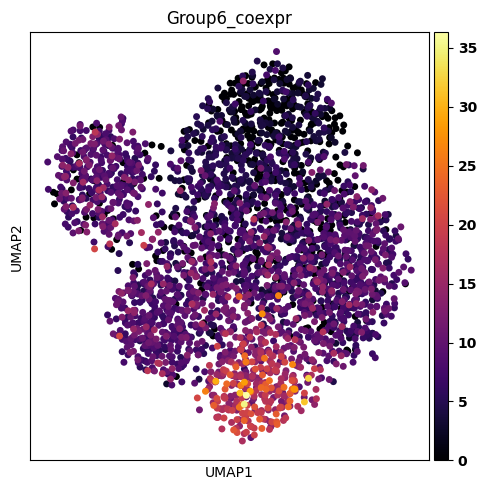

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


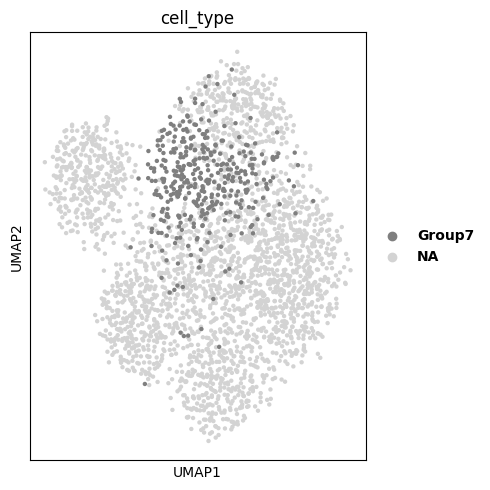

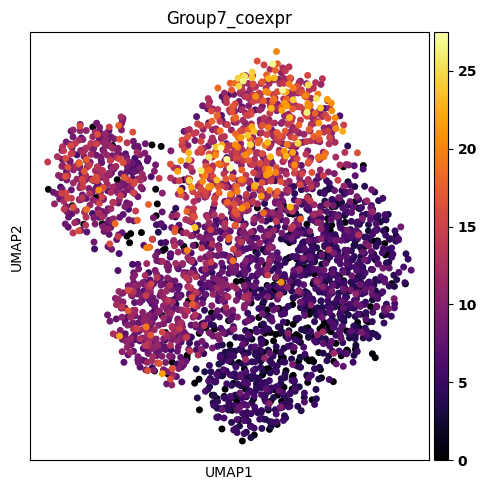

In [18]:
cmap = 'inferno'
s = 100
for coli in range(scores.shape[1]):

    fig, ax = plt.subplots(figsize=(5, 5))
    sc.pl.umap(data, color='cell_type', ax=ax, groups=[f'Group{coli}'], show=False)
    plt.show()
    
    fig, ax = plt.subplots(figsize=(5, 5))
    sc.pl.umap(data, color=f'Group{coli}_coexpr', ax=ax, show=False, cmap=cmap, size=s)
    plt.show()

## Now let's try with Giotto scoring

In [ ]:
cs.giotto_page_enrich(data, 'cell_type', cluster_marker_key='cell_type_markers')
data.obsm['giotto_enrich_scores'] = data.obsm['cell_type_enrich_scores']

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


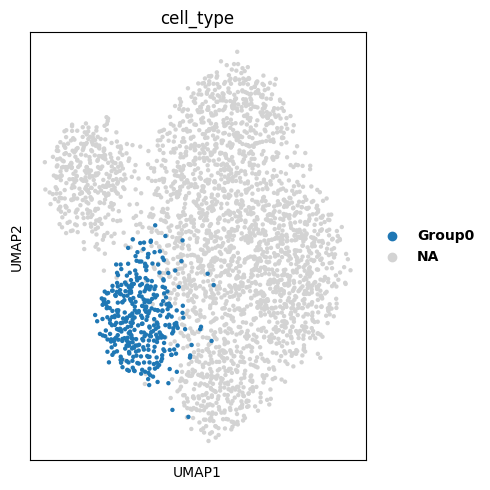

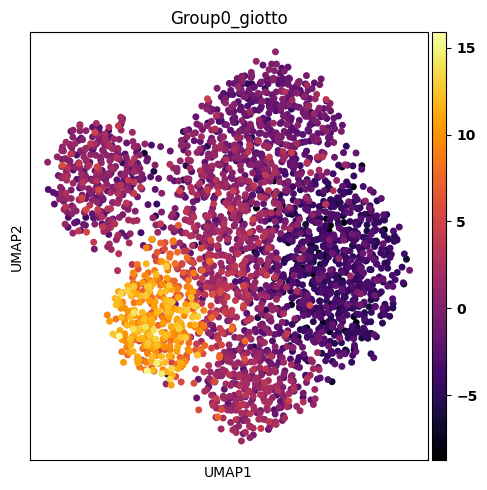

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


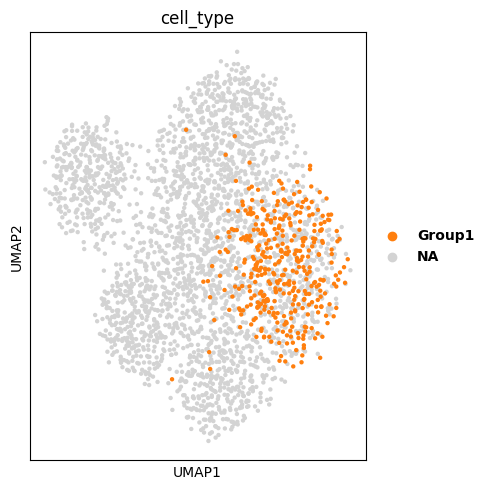

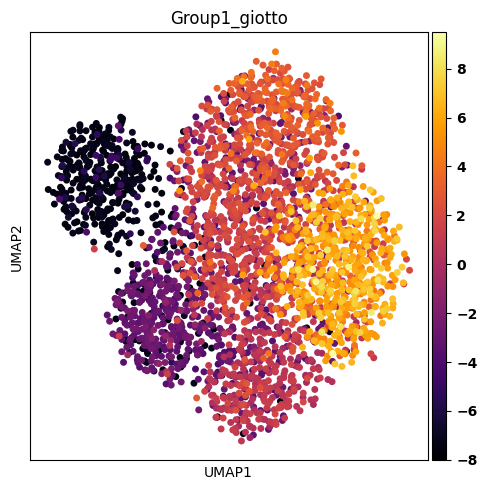

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


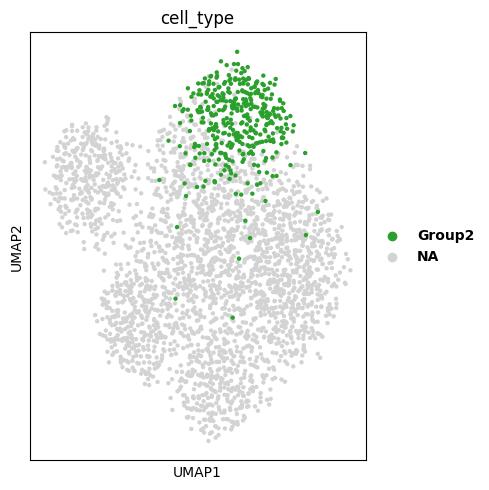

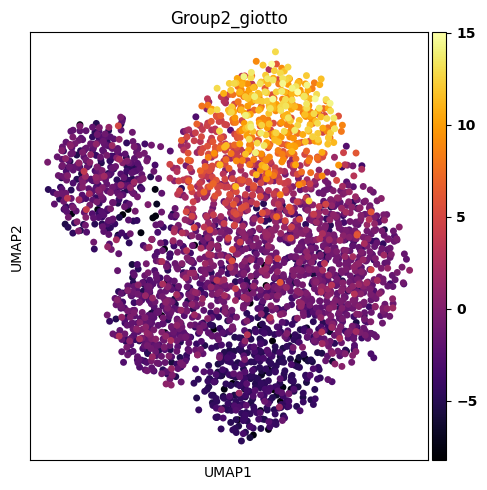

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


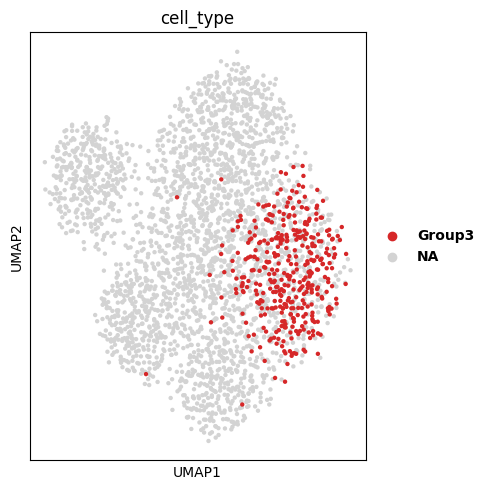

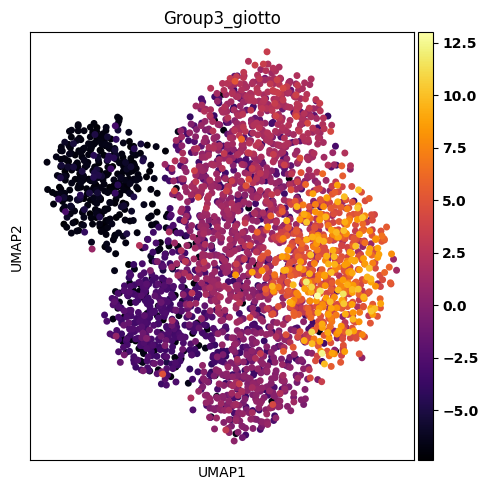

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


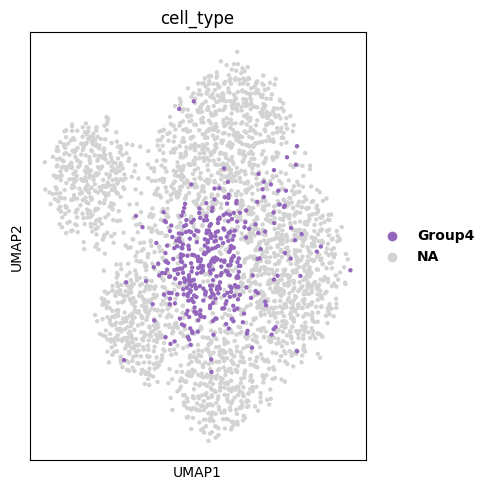

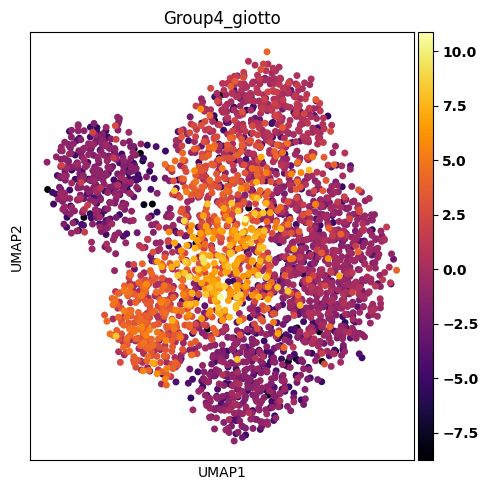

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


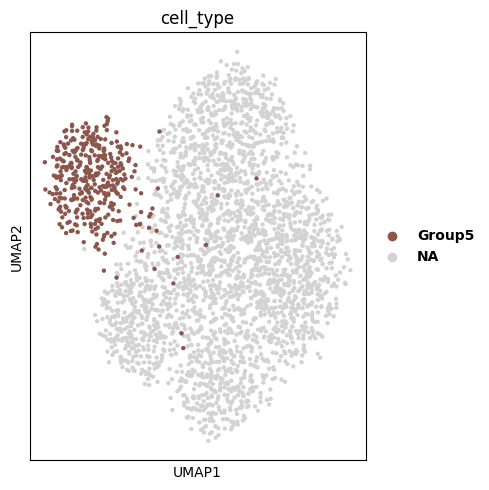

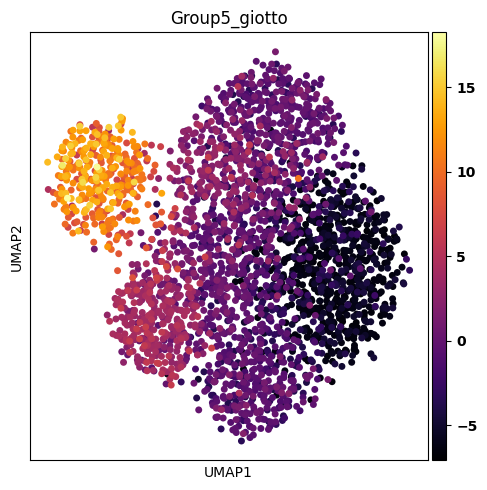

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


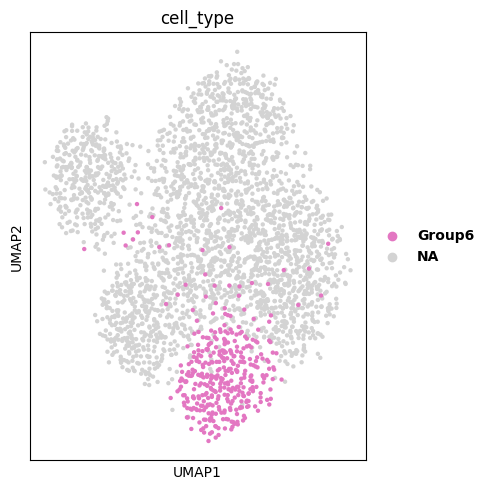

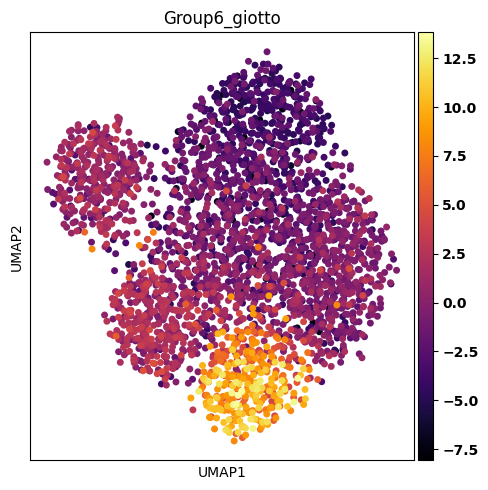

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


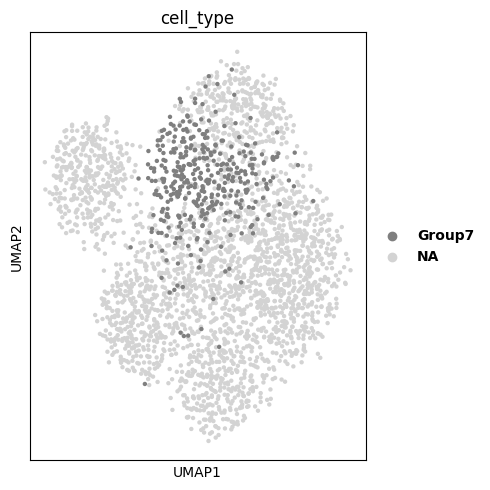

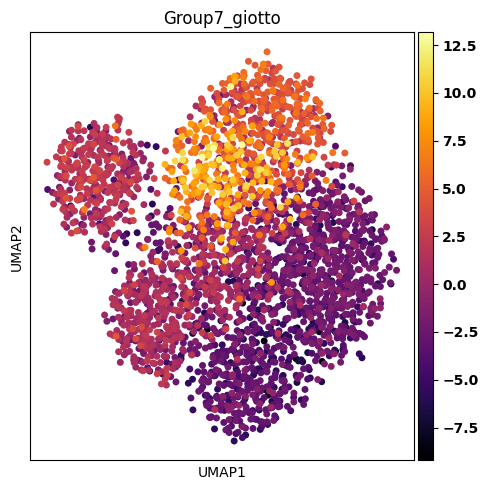

In [24]:
cmap = 'inferno'
s = 100
for coli in range(scores.shape[1]):

    fig, ax = plt.subplots(figsize=(5, 5))
    sc.pl.umap(data, color='cell_type', ax=ax, groups=[f'Group{coli}'], show=False)
    plt.show()
    
    fig, ax = plt.subplots(figsize=(5, 5))
    sc.pl.umap(data, color=f'Group{coli}_giotto', ax=ax, show=False, cmap=cmap, size=s)
    plt.show()

## Now let's try with scanpy

In [28]:
group_to_de

{'Group0': array(['Gene702', 'Gene824', 'Gene1880', 'Gene5671', 'Gene6481',
        'Gene7434'], dtype=object),
 'Group1': array(['Gene3094', 'Gene3792', 'Gene5671'], dtype=object),
 'Group2': array(['Gene3094', 'Gene3776', 'Gene5066', 'Gene5671', 'Gene6481',
        'Gene7274'], dtype=object),
 'Group3': array(['Gene3094', 'Gene3792', 'Gene5671', 'Gene6871'], dtype=object),
 'Group4': array(['Gene702', 'Gene3094', 'Gene5671', 'Gene7434'], dtype=object),
 'Group5': array(['Gene393', 'Gene702', 'Gene824', 'Gene3776', 'Gene7274',
        'Gene7434'], dtype=object),
 'Group6': array(['Gene393', 'Gene1880', 'Gene3792', 'Gene5671', 'Gene7434',
        'Gene7970'], dtype=object),
 'Group7': array(['Gene393', 'Gene702', 'Gene3094', 'Gene5671', 'Gene6481',
        'Gene7274'], dtype=object)}

In [ ]:
scanpy_scores = np.zeros((data.shape[0], len(group_to_de)))
for i, group in enumerate(group_to_de):
    sc.tl.score_genes(data, group_to_de[group])
    scanpy_scores[:,i] = data.obs['score'].values
    
scanpy_scores = pd.DataFrame(scanpy_scores, index=data.obs_names, columns = list(group_to_de.keys()))

data.obsm['cell_type_enrich_scores'] = scanpy_scores
data.obsm['scanpy_enrich_scores'] = data.obsm['cell_type_enrich_scores']

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


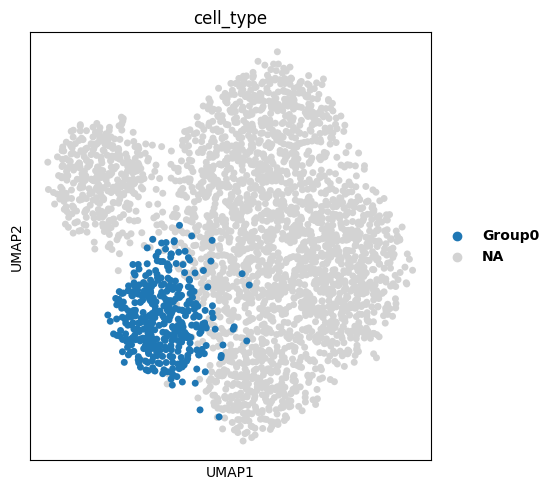

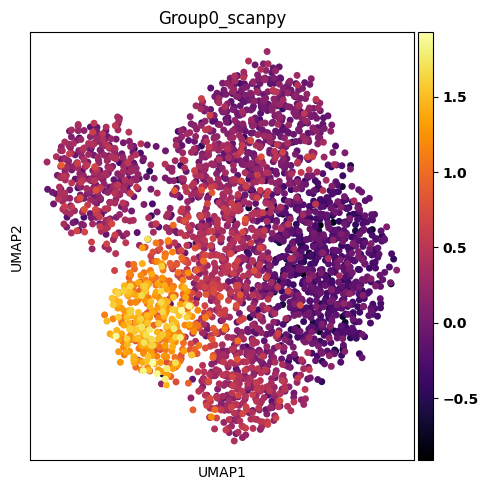

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


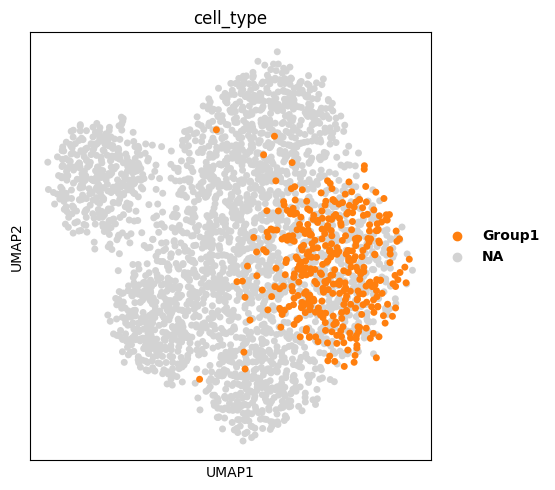

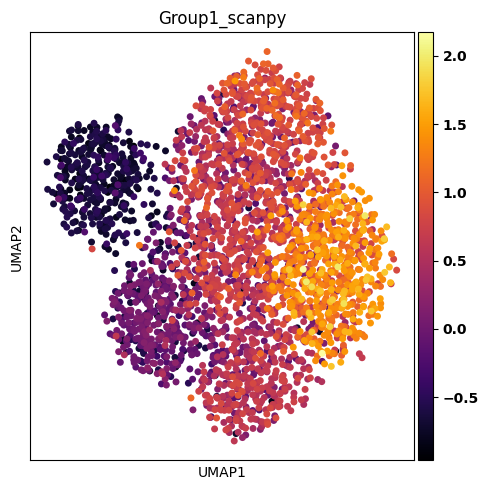

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


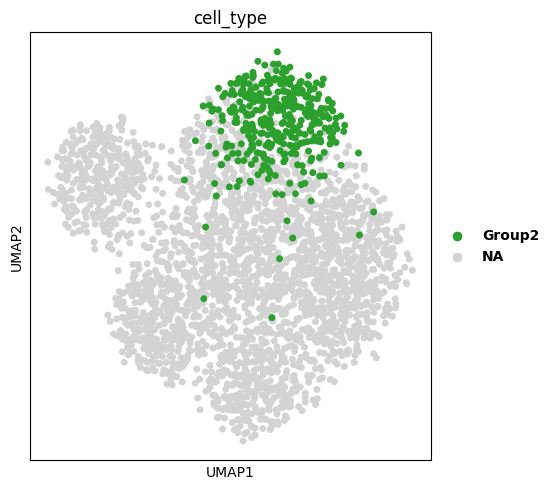

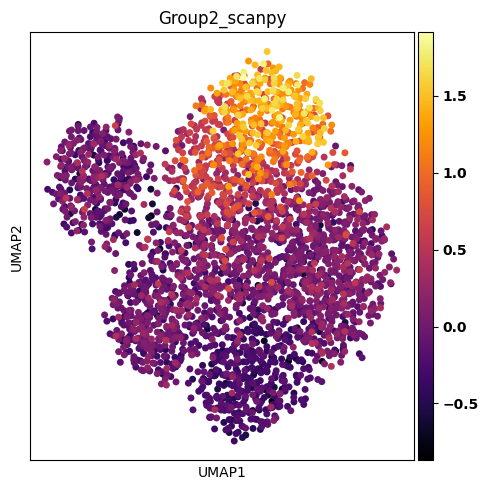

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


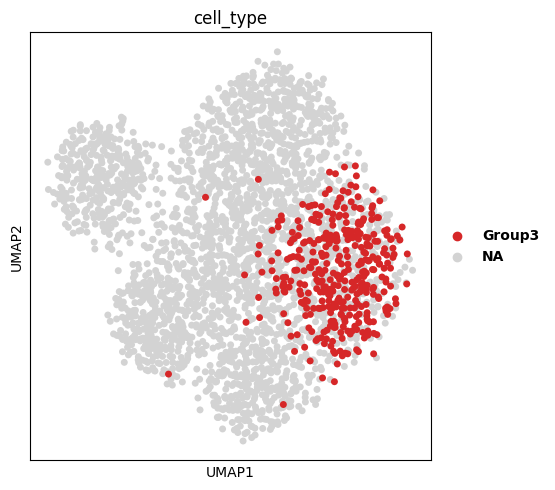

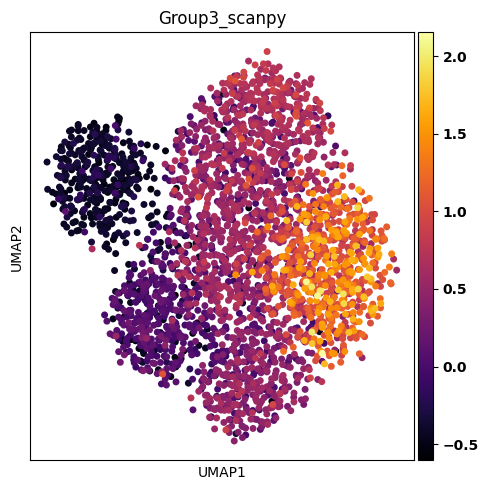

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


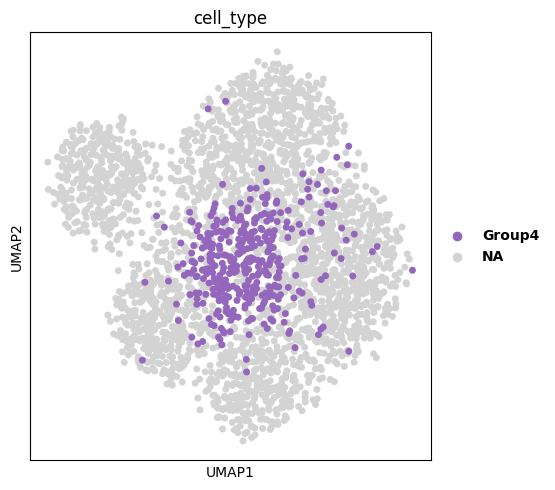

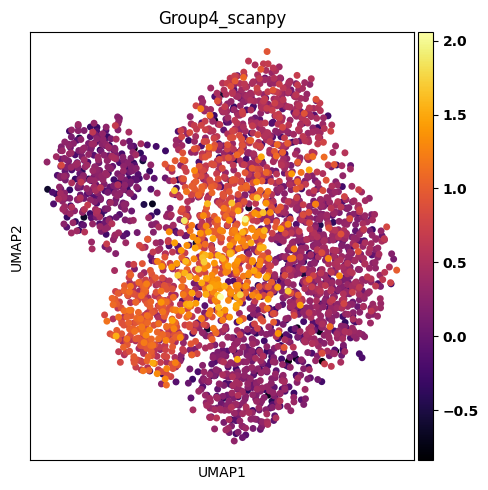

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


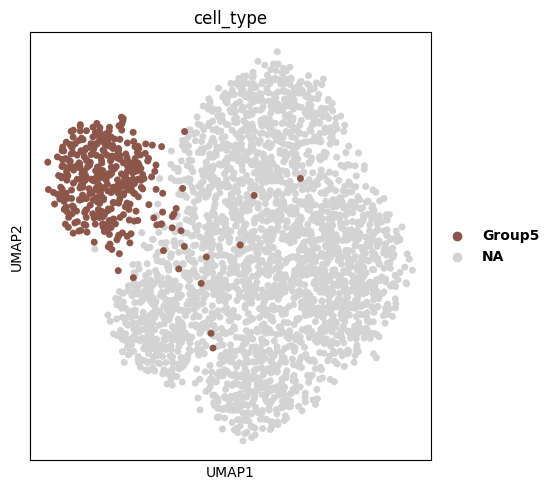

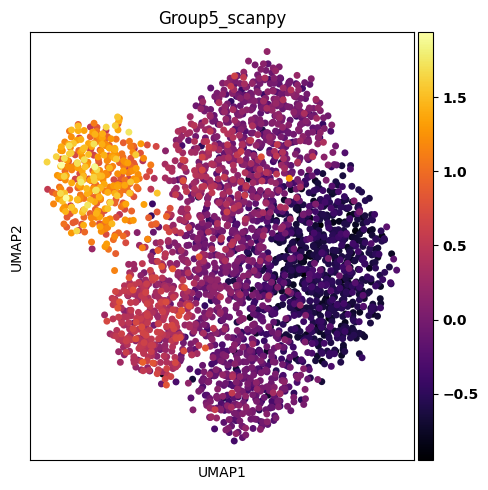

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


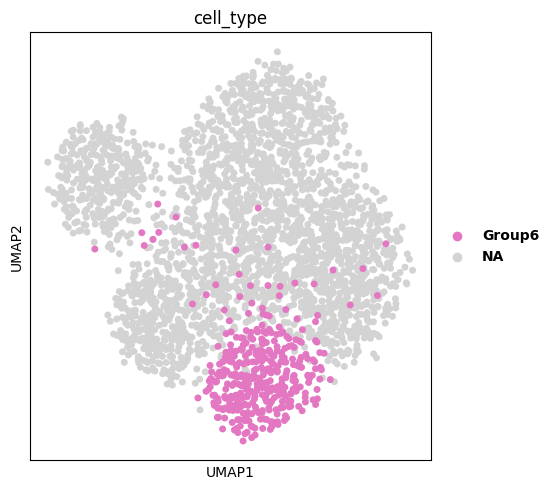

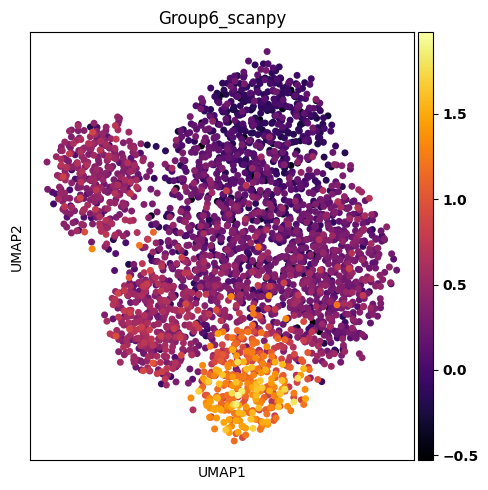

/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:1171: FutureWarning: Categorical.replace is deprecated and will be removed in a future version. Use Series.replace directly instead.
  values = values.replace(values.categories.difference(groups), np.nan)


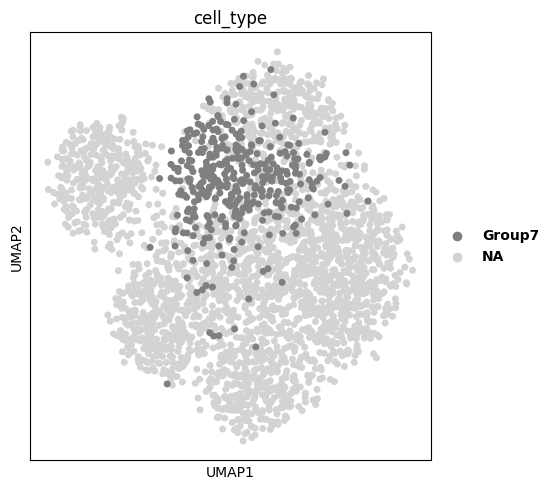

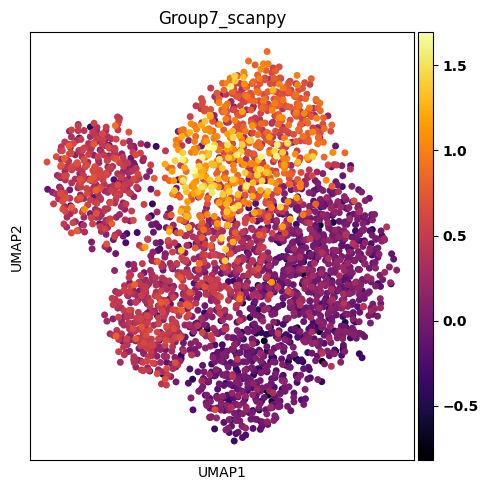

In [31]:
cmap = 'inferno'
s = 100
for coli in range(scores.shape[1]):

    fig, ax = plt.subplots(figsize=(5.65, 5))
    sc.pl.umap(data, color='cell_type', ax=ax, groups=[f'Group{coli}'], show=False, size=s)
    plt.show()
    
    fig, ax = plt.subplots(figsize=(5, 5))
    sc.pl.umap(data, color=f'Group{coli}_scanpy', ax=ax, show=False, cmap=cmap, size=s)
    plt.show()

## Negative gene set score=0

Test negative gene set filtering for each scoring method.

#### To determine the negative gene set cells, will find zero scoring cells in code-score, that are not 0 in coexpr-score (these are the negative set co-expressing cells).

In [35]:
data.obsm.keys()

KeysView(AxisArrays with keys: X_pca, X_umap, cell_type_enrich_scores, code_enrich_scores, coexpr_enrich_scores, giotto_enrich_scores, scanpy_enrich_scores)

In [36]:
code_scores = data.obsm['code_enrich_scores']
coexpr_scores = data.obsm['coexpr_enrich_scores']

negative_set_cells = np.logical_and(code_scores==0, coexpr_scores>0)

In [38]:
negative_set_cells.sum()

Group0    2091
Group1     425
Group2    2031
Group3    1218
Group4    1958
Group5    1706
Group6    2206
Group7    2417
dtype: int64

In [47]:
giotto_neg_scores = data.obsm['giotto_enrich_scores'].copy()
scanpy_neg_scores = data.obsm['scanpy_enrich_scores'].copy()

giotto_neg_scores[negative_set_cells] = 0
scanpy_neg_scores[negative_set_cells] = 0

data.obsm['giotto-neg_enrich_scores'] = giotto_neg_scores
data.obsm['scanpy-neg_enrich_scores'] = scanpy_neg_scores

## Comparing methods head-to-head

Now comparing methods by:

    1) Classification case, using ROC curve
    2) Comparing distribution of specificity scores

### Classification accuracy

Following tutorial here:
https://scikit-learn.org/stable/auto_examples/model_selection/plot_roc.html#sphx-glr-auto-examples-model-selection-plot-roc-py

In [48]:
from sklearn.metrics import roc_curve, auc
from sklearn.preprocessing import label_binarize
from sklearn.metrics import roc_auc_score, confusion_matrix, accuracy_score, f1_score, \
                                precision_score, recall_score, zero_one_loss

from sklearn import svm, datasets

In [49]:
methods = ['code', 'coexpr', 'giotto', 'scanpy']
method_colors = {'code': 'cyan', 'coexpr': 'dodgerblue',
                'giotto': 'magenta', 'scanpy': 'gold'}

In [50]:
# Binarize the output
y = data.obs['cell_type'].values.astype(str)

classes = np.unique(y)
print(classes)

y = label_binarize(y, classes=classes)
n_classes = y.shape[1]

print(n_classes)
print(y)
print(y.shape)

['Group0' 'Group1' 'Group2' 'Group3' 'Group4' 'Group5' 'Group6' 'Group7']
8
[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 1]
 [0 0 0 ... 0 1 0]
 ...
 [0 1 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]
(3000, 8)


In [51]:
data.obsm.keys()

KeysView(AxisArrays with keys: X_pca, X_umap, cell_type_enrich_scores, code_enrich_scores, coexpr_enrich_scores, giotto_enrich_scores, scanpy_enrich_scores, giotto_neg-enrich_scores, scanpy_neg-enrich_scores, giotto-neg_enrich_scores, scanpy-neg_enrich_scores)

In [52]:
results = np.zeros((len(methods)*y.shape[1], 5))

rowi = 0

method_label = []
ct_label = []

avg_method='binary'
for i, method in enumerate(methods):
    y_scores = data.obsm[f'{method}_enrich_scores'].values
        
    for j in range(y.shape[1]):
        
        y_true = y[:,j]
        y_pred = (y_scores[:,j] > 0).astype(int)
        
        results[rowi, 0] = accuracy_score(y_true, y_pred)
        results[rowi, 1] = f1_score(y_true, y_pred, average=avg_method)
        results[rowi, 2] = precision_score(y_true, y_pred, average=avg_method)
        results[rowi, 3] = recall_score(y_true, y_pred, average=avg_method)
        results[rowi, 4] = zero_one_loss(y_true, y_pred)

        rowi += 1
        method_label.append( method )
        ct_label.append( classes[j] )
        
results = pd.DataFrame(results, columns=['accuracy', 'f1_score', 'precision', 
                                         'recall', 'zero_one_loss'])
results = sc.AnnData(results)
results.obs['method'] = method_label
results.obs['method'] = results.obs['method'].astype('category')
results.obs['cell_type'] = ct_label
results.obs['cell_type'] = results.obs['cell_type'].astype('category')

results.uns['method_colors'] = [method_colors[val] for val in results.obs['method'].cat.categories]

/var/folders/rn/d63kt38x6bdgvshgsmrl6qjd2nmrfb/T/ipykernel_44455/3064372739.py:29: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  results = sc.AnnData(results)
/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


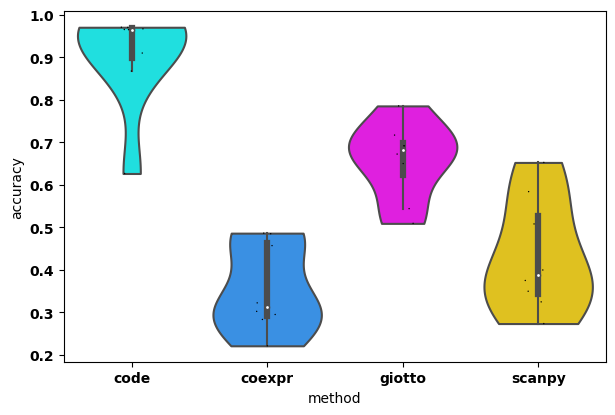

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


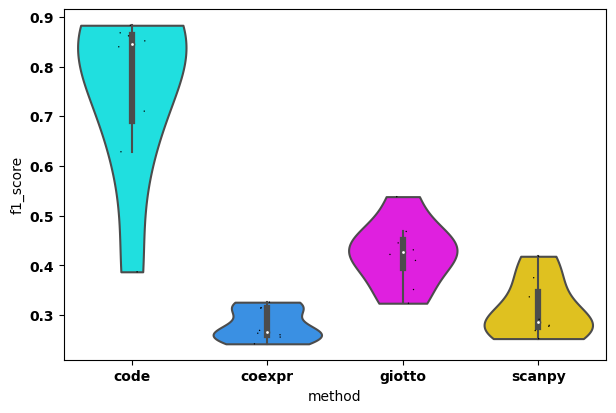

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


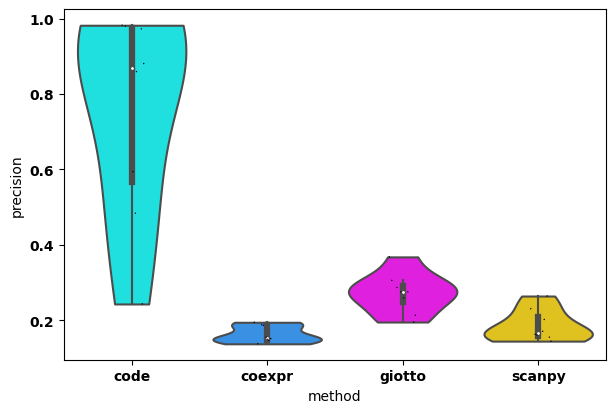

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


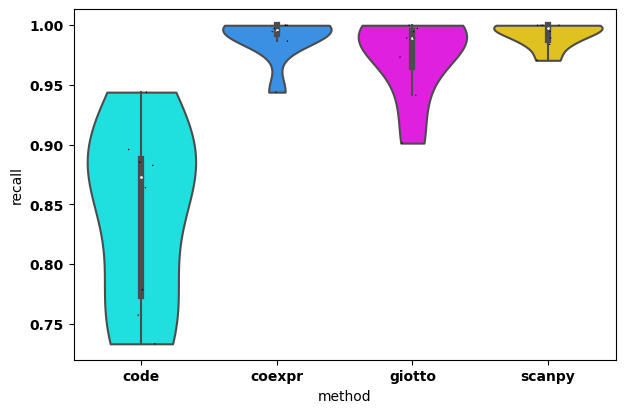

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


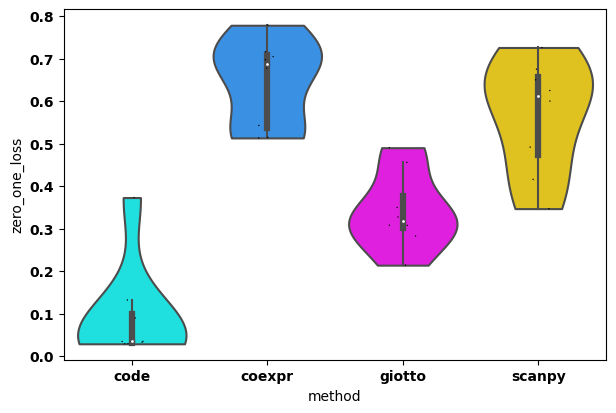

In [53]:
sc.pl.violin(results, 'accuracy', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'f1_score', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'precision', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'recall', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'zero_one_loss', groupby='method', inner='box', show=False, vmin=0)
plt.show()

### Now with negative gene set scoring...

In [57]:
methods = ['code', 'coexpr', 'giotto', 'giotto-neg', 'scanpy', 'scanpy-neg']
method_colors = {'code': 'cyan', 'coexpr': 'dodgerblue',
                'giotto': 'magenta', 'giotto-neg': 'orchid', 
                 'scanpy': 'gold', 'scanpy-neg': 'goldenrod'}

In [58]:
results = np.zeros((len(methods)*y.shape[1], 5))

rowi = 0

method_label = []
ct_label = []

avg_method='binary'
for i, method in enumerate(methods):
    y_scores = data.obsm[f'{method}_enrich_scores'].values
        
    for j in range(y.shape[1]):
        
        y_true = y[:,j]
        y_pred = (y_scores[:,j] > 0).astype(int)
        
        results[rowi, 0] = accuracy_score(y_true, y_pred)
        results[rowi, 1] = f1_score(y_true, y_pred, average=avg_method)
        results[rowi, 2] = precision_score(y_true, y_pred, average=avg_method)
        results[rowi, 3] = recall_score(y_true, y_pred, average=avg_method)
        results[rowi, 4] = zero_one_loss(y_true, y_pred)

        rowi += 1
        method_label.append( method )
        ct_label.append( classes[j] )
        
results = pd.DataFrame(results, columns=['accuracy', 'f1_score', 'precision', 
                                         'recall', 'zero_one_loss'])
results = sc.AnnData(results)
results.obs['method'] = method_label
results.obs['method'] = results.obs['method'].astype('category')
results.obs['cell_type'] = ct_label
results.obs['cell_type'] = results.obs['cell_type'].astype('category')

results.uns['method_colors'] = [method_colors[val] for val in results.obs['method'].cat.categories]

/var/folders/rn/d63kt38x6bdgvshgsmrl6qjd2nmrfb/T/ipykernel_44455/3064372739.py:29: FutureWarning: X.dtype being converted to np.float32 from float64. In the next version of anndata (0.9) conversion will not be automatic. Pass dtype explicitly to avoid this warning. Pass `AnnData(X, dtype=X.dtype, ...)` to get the future behavour.
  results = sc.AnnData(results)
/Users/uqbbalde/miniforge3/envs/hypo_atlas/lib/python3.8/site-packages/anndata/_core/anndata.py:121: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


In [119]:
result_df = results.to_df()

In [120]:
result_df.mean()

accuracy         0.688583
f1_score         0.540207
precision        0.470428
recall           0.914445
zero_one_loss    0.311417
dtype: float32

In [123]:
method_label = np.array(method_label)
result_df = results.to_df()
for method in methods:
    
    method_df = result_df.loc[method_label==method,:]
    print(method)
    print(method_df.mean())

code
accuracy         0.905333
f1_score         0.753743
precision        0.749588
recall           0.842667
zero_one_loss    0.094667
dtype: float32
coexpr
accuracy         0.356583
f1_score         0.281043
precision        0.164200
recall           0.989667
zero_one_loss    0.643417
dtype: float32
giotto
accuracy         0.657750
f1_score         0.423973
precision        0.272797
recall           0.973333
zero_one_loss    0.342250
dtype: float32
giotto-neg
accuracy         0.908208
f1_score         0.756578
precision        0.752945
recall           0.842000
zero_one_loss    0.091792
dtype: float32
scanpy
accuracy         0.433417
f1_score         0.312760
precision        0.186848
recall           0.992333
zero_one_loss    0.566583
dtype: float32
scanpy-neg
accuracy         0.870208
f1_score         0.713144
precision        0.696192
recall           0.846667
zero_one_loss    0.129792
dtype: float32


/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


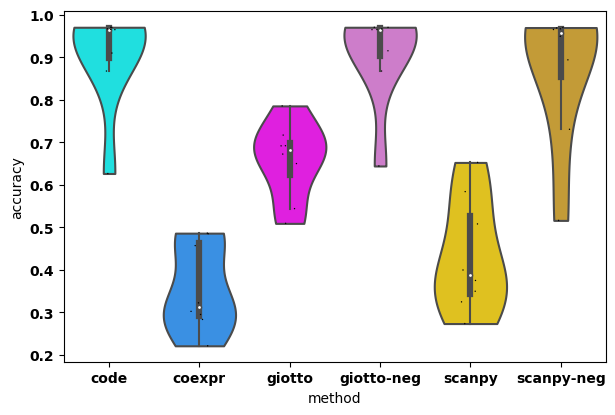

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


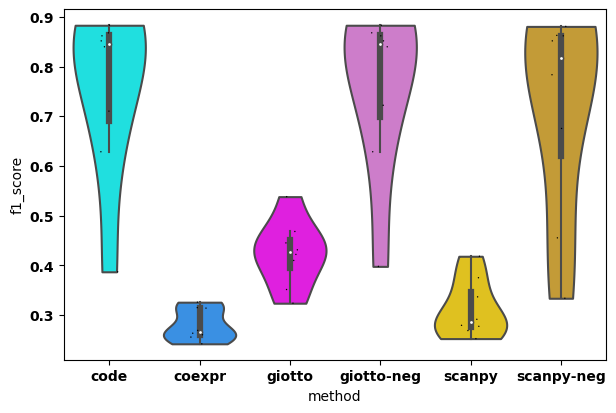

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


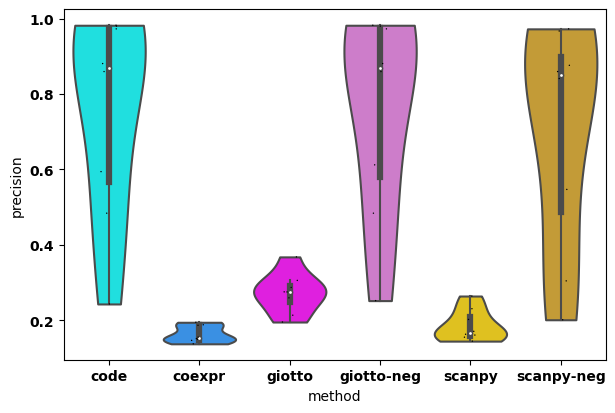

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


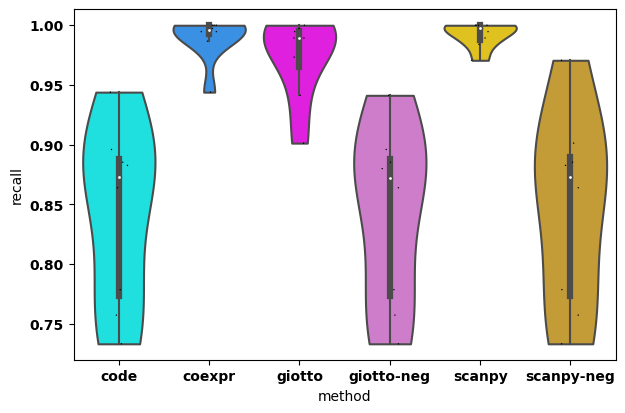

/Users/uqbbalde/Desktop/Uni_Studies/myPython/BeautifulCells/beautifulcells/visualisation/helpers.py:19: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


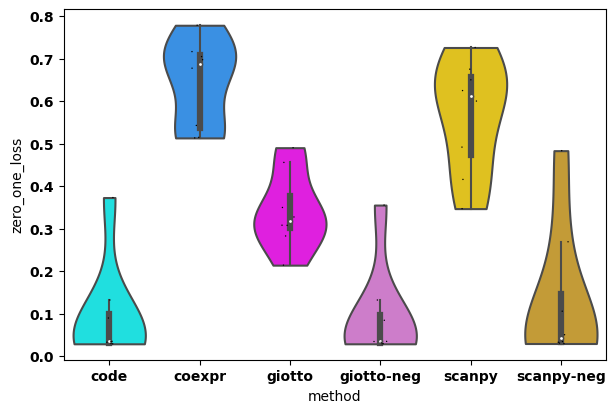

In [59]:
sc.pl.violin(results, 'accuracy', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'f1_score', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'precision', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'recall', groupby='method', inner='box', show=False, vmin=0)
plt.show()
sc.pl.violin(results, 'zero_one_loss', groupby='method', inner='box', show=False, vmin=0)
plt.show()

## ROC curve validation.

#### Split each group into 3 artificial subclusters, with subclusters of the same cluster NOT being significantly different from one another.

In [61]:
truth_col = 'cell_type'
truth_labels = data.obs[truth_col].values.astype(str)
truth_set = np.unique( truth_labels )

n_subclusters = 3
overcluster_labels = np.array([' '*max([len(truth+'_number') for truth in truth_set])]*len(truth_labels))
n_cells = []
n_rand_cells = []
for i, truth in enumerate(truth_set):
    truth_indices = np.where( truth_labels==truth )[0]
    n_cells.append( len(truth_indices) )
    if len(truth_indices) > 20:
        n_rands = [len(truth_indices)//n_subclusters for i_ in range(n_subclusters)]
        n_rands[0] += len(truth_indices)%n_subclusters
    else:
        n_rands = [len(truth_indices)]
    
    sampled_indices = []
    for sampj in range(len(n_rands)):
        indices = np.random.choice([index for index in truth_indices if index not in sampled_indices], 
                                   n_rands[sampj], replace=False)
        sampled_indices.extend( indices )
        
        overcluster_labels[indices] = f'{truth}_{sampj}'
        n_rand_cells.append(len(indices))

In [62]:
### Now setting the overclusters...
data.obs[f'overclusters'] = overcluster_labels
data.obs[f'overclusters'] = data.obs[f'overclusters'].astype('category')

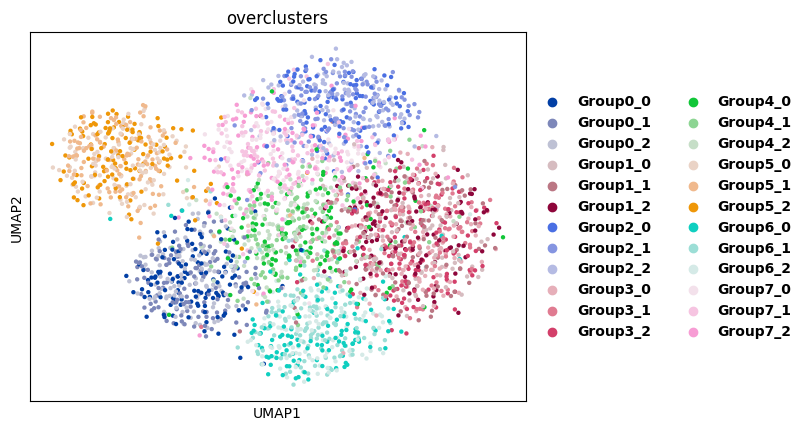

In [63]:
sc.pl.umap(data, color='overclusters')

### Running Cytocipher cluster merge for each of the different approach on this over-clustered data.

In [65]:
import cytocipher as cc
import cytocipher.score_and_merge.cluster_merge as cm
imp.reload(cm)
imp.reload(cc.tl)

<module 'cytocipher.tl' from '/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/tl.py'>

In [ ]:
cc.tl.get_markers(data, 'overclusters')

### Determining markers 

In [68]:
data.uns['overclusters_markers']

{'Group0_0': array(['Gene824', 'Gene1880', 'Gene702', 'Gene6481', 'Gene7434'],
       dtype=object),
 'Group0_1': array(['Gene824', 'Gene1880', 'Gene6481', 'Gene702', 'Gene7434'],
       dtype=object),
 'Group0_2': array(['Gene824', 'Gene1880', 'Gene702', 'Gene6481', 'Gene7434'],
       dtype=object),
 'Group1_0': array(['Gene3792', 'Gene3094', 'Gene3907', 'Gene987'], dtype=object),
 'Group1_1': array(['Gene3792', 'Gene3094', 'Gene3001', 'Gene5152', 'Gene862'],
       dtype=object),
 'Group1_2': array(['Gene3094', 'Gene3792', 'Gene3483'], dtype=object),
 'Group2_0': array(['Gene6481', 'Gene3776', 'Gene7274', 'Gene5066', 'Gene3094'],
       dtype=object),
 'Group2_1': array(['Gene3776', 'Gene6481', 'Gene7274', 'Gene5066', 'Gene3094'],
       dtype=object),
 'Group2_2': array(['Gene6481', 'Gene3776', 'Gene7274', 'Gene5066', 'Gene3094'],
       dtype=object),
 'Group3_0': array(['Gene3792', 'Gene6871', 'Gene3094', 'Gene5671'], dtype=object),
 'Group3_1': array(['Gene6871', 'Gene3792', 'Ge

### Scoring with each method

In [ ]:
cluster_key = 'overclusters'
marker_key = 'overclusters_markers'

### Code-scoring
cs.code_enrich(data, cluster_key, cluster_marker_key=marker_key, squash_exception=True)
data.obsm[f'code_{cluster_key}_enrich_scores'] = data.obsm[f'{cluster_key}_enrich_scores']

### Coexpr-scoring
cs.coexpr_enrich(data, cluster_key, cluster_marker_key=marker_key)
data.obsm[f'coexpr_{cluster_key}_enrich_scores'] = data.obsm[f'{cluster_key}_enrich_scores']

### Giotto-scoring
cs.giotto_page_enrich(data, cluster_key, cluster_marker_key=marker_key)
data.obsm[f'giotto_{cluster_key}_enrich_scores'] = data.obsm[f'{cluster_key}_enrich_scores']

### Scanpy-scoring
scanpy_scores = np.zeros((data.shape[0], len(data.uns[marker_key])))
for i, group in enumerate(data.uns[marker_key]):
    sc.tl.score_genes(data, data.uns[marker_key][group])
    scanpy_scores[:,i] = data.obs['score'].values
scanpy_scores = pd.DataFrame(scanpy_scores, index=data.obs_names, columns = list(data.uns[marker_key].keys()))
data.obsm[f'scanpy_{cluster_key}_enrich_scores'] = scanpy_scores

### Negative set score=0

In [72]:
code_scores = data.obsm[f'code_{cluster_key}_enrich_scores']
coexpr_scores = data.obsm[f'coexpr_{cluster_key}_enrich_scores']

negative_set_cells = np.logical_and(code_scores==0, coexpr_scores>0)

giotto_neg_scores = data.obsm[f'giotto_{cluster_key}_enrich_scores'].copy()
scanpy_neg_scores = data.obsm[f'scanpy_{cluster_key}_enrich_scores'].copy()

giotto_neg_scores[negative_set_cells] = 0
scanpy_neg_scores[negative_set_cells] = 0

data.obsm[f'giotto-neg_{cluster_key}_enrich_scores'] = giotto_neg_scores
data.obsm[f'scanpy-neg_{cluster_key}_enrich_scores'] = scanpy_neg_scores

### Getting cluster pair p-values

In [73]:
import cytocipher.score_and_merge.cluster_merge as cm
imp.reload(cm)

<module 'cytocipher.score_and_merge.cluster_merge' from '/Users/uqbbalde/Desktop/Uni_Studies/myPython/neurotools/cytocipher/score_and_merge/cluster_merge.py'>

In [75]:
methods = ['code', 'coexpr', 'giotto', 'giotto-neg', 'scanpy', 'scanpy-neg']
method_colors = {'code': 'cyan', 'coexpr': 'dodgerblue',
                'giotto': 'magenta', 'giotto-neg': 'orchid', 
                 'scanpy': 'gold', 'scanpy-neg': 'goldenrod'}

In [77]:
k=15
mnn_frac_cutoff=None
random_state=20
p_cut=0.01
score_group_method='quantiles'
p_adjust=True
p_adjust_method='fdr_bh'

In [78]:
method_ps = {}
for method in methods:
    data.obsm[f'{cluster_key}_enrich_scores'] = data.obsm[f'{method}_{cluster_key}_enrich_scores']
    cm.merge_clusters_single(data, cluster_key, f'{cluster_key}_merged',
                            k=k, mnn_frac_cutoff=mnn_frac_cutoff, random_state=random_state,
                          p_cut=p_cut,
                          score_group_method=score_group_method,
                          p_adjust=p_adjust, p_adjust_method=p_adjust_method,
                          verbose=False)
    
    method_ps[method] = data.uns[f'{cluster_key}_ps']

### Benchmarking with ROC and AUROC values.

In [80]:
##### Let's get true versus false pairs based on pairs which belong to same higher cluster...
groupby = 'overclusters'
pairs = np.array(list(data.uns[f'{groupby}_ps'].keys()))
pair_labels = []
pair_new_label = []

# Ground truth labels; clusters which mutually fall within one of these clusters should not be different.
ground_truth = data.obs['cell_type'].values.astype(str)
ground_truth_set = np.unique( ground_truth )
for pair in pairs:
    pair1 = [label for label in ground_truth_set if pair.split('_')[0]==label][0]
    pair1 = pair1+'_'+pair.split(pair1)[1].split('_')[1]
    pair2 = pair.split(pair1)[1].strip('_')
    #print(pair)
    #print(pair1, '---', pair2, '\n')
    truth1 = pair1.split('_')[0]
    truth2 = pair2.split('_')[0]
    
    if truth1 == truth2:
        pair_labels.append( 1 )
        pair_new_label.append( truth1 )
    else:
        pair_labels.append( 0 )
        pair_new_label.append('other')

pair_new_label = np.array(pair_new_label)
pair_labels = np.array( pair_labels )

In [89]:
from sklearn.metrics import roc_curve, auc
from sklearn.metrics import roc_auc_score

##### Logging to try and get a better range...
res = 300
p_cuts = np.array([2**(-i) for i in range(res)]+[0])[::-1]
p_cuts = p_cuts
p_cuts

array([0.00000000e+00, 9.81818693e-91, 1.96363739e-90, 3.92727477e-90,
       7.85454954e-90, 1.57090991e-89, 3.14181982e-89, 6.28363964e-89,
       1.25672793e-88, 2.51345585e-88, 5.02691171e-88, 1.00538234e-87,
       2.01076468e-87, 4.02152937e-87, 8.04305873e-87, 1.60861175e-86,
       3.21722349e-86, 6.43444699e-86, 1.28688940e-85, 2.57377879e-85,
       5.14755759e-85, 1.02951152e-84, 2.05902304e-84, 4.11804607e-84,
       8.23609214e-84, 1.64721843e-83, 3.29443686e-83, 6.58887371e-83,
       1.31777474e-82, 2.63554949e-82, 5.27109897e-82, 1.05421979e-81,
       2.10843959e-81, 4.21687918e-81, 8.43375835e-81, 1.68675167e-80,
       3.37350334e-80, 6.74700668e-80, 1.34940134e-79, 2.69880267e-79,
       5.39760535e-79, 1.07952107e-78, 2.15904214e-78, 4.31808428e-78,
       8.63616856e-78, 1.72723371e-77, 3.45446742e-77, 6.90893484e-77,
       1.38178697e-76, 2.76357394e-76, 5.52714788e-76, 1.10542958e-75,
       2.21085915e-75, 4.42171830e-75, 8.84343660e-75, 1.76868732e-74,
      

In [90]:
from statsmodels.stats.multitest import multipletests

##### Which method gets ground-truth best???
method_labels = []
adjust = False

method_fprs = {}
method_tprs = {}
method_aucs = {}

for j, method in enumerate(methods):

    # Get p-values
    pvals = np.array([method_ps[method][pair] for pair in pairs])
    # Randomising order just to make sure random is RANDOM!
    #pvals = np.random.choice(pvals, size=len(pvals), replace=False)
    if adjust:
        pvals = multipletests(pvals, method='fdr_bh')[1]
  
    # Compute ROC curve and ROC area for each class
    n_nonsig, n_sig = sum(pair_labels==1), sum(pair_labels==0)
    fpr, tpr = np.zeros((len(p_cuts))), np.zeros((len(p_cuts)))
    for pi, p_cut_ in enumerate(p_cuts):
        nonsig_bool = pvals >= p_cut_
        
        tp = sum(np.logical_and(nonsig_bool, pair_labels==1))
        tpr[pi] = tp / n_nonsig
        
        fp = sum(np.logical_and(nonsig_bool, pair_labels==0))
        #print(p_cut, fp)
        fpr[pi] = fp / n_sig
    
    #print(thresholds)
    roc_auc = auc(fpr, tpr)
    
    method_fprs[method] = fpr
    method_tprs[method] = tpr
    method_aucs[method] = roc_auc
    
    print(method, roc_auc)

code 0.9960317460317458
coexpr 0.9912367724867723
giotto 0.9989252645502646
giotto-neg 0.9962384259259258
scanpy 0.9988839285714285
scanpy-neg 0.9964037698412699


In [91]:
methods

['code', 'coexpr', 'giotto', 'giotto-neg', 'scanpy', 'scanpy-neg']

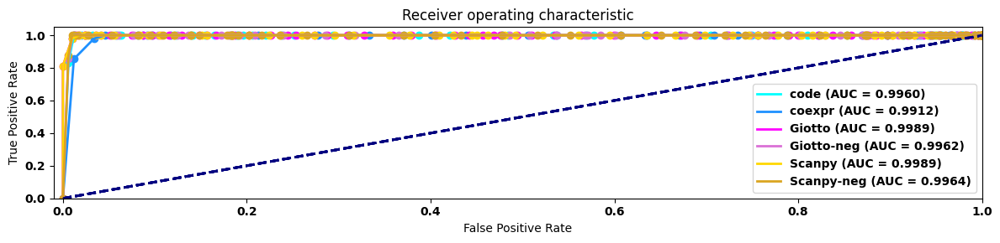

In [134]:
method_names = ['code', 'coexpr', 'Giotto', 'Giotto-neg', 'Scanpy', 'Scanpy-neg']

plt.figure(figsize=(12,3))
for j, method in enumerate(methods):
    fpr = method_fprs[method]
    tpr = method_tprs[method]
    roc_auc = method_aucs[method]

    lw = 2
    plt.plot(
        fpr,
        tpr,
        color=method_colors[method],
        lw=lw,
        label=f"{method_names[j]} (AUC = %0.4f)" % roc_auc,
    )
    plt.scatter(fpr, tpr, color=method_colors[method],)
    plt.plot([0, 1], [0, 1], color="navy", lw=lw, linestyle="--")
    plt.xlim([-0.01, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("Receiver operating characteristic")
    plt.legend(loc="lower right")
plt.show()